In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

### Data Cleaning

In [2]:
df =pd.read_csv('Traffic_Collision_Data.csv')
df.head()

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Description,MO Codes,Victim Age,Victim Sex,Victim Descent,Premise Code,Premise Description,Address,Cross Street,Location
0,190319651,08/24/2019,08/24/2019,450,3,Southwest,356,997,TRAFFIC COLLISION,3036 3004 3026 3101 4003,22.0,M,H,101.0,STREET,JEFFERSON BL,NORMANDIE AV,"(34.0255, -118.3002)"
1,190319680,08/30/2019,08/30/2019,2320,3,Southwest,355,997,TRAFFIC COLLISION,3037 3006 3028 3030 3039 3101 4003,30.0,F,H,101.0,STREET,JEFFERSON BL,W WESTERN,"(34.0256, -118.3089)"
2,190413769,08/25/2019,08/25/2019,545,4,Hollenbeck,422,997,TRAFFIC COLLISION,3101 3401 3701 3006 3030,NaN,M,X,101.0,STREET,N BROADWAY,W EASTLAKE AV,"(34.0738, -118.2078)"
3,190127578,11/20/2019,11/20/2019,350,1,Central,128,997,TRAFFIC COLLISION,0605 3101 3401 3701 3011 3034,21.0,M,H,101.0,STREET,1ST,CENTRAL,"(34.0492, -118.2391)"
4,190319695,08/30/2019,08/30/2019,2100,3,Southwest,374,997,TRAFFIC COLLISION,0605 4025 3037 3004 3025 3101,49.0,M,B,101.0,STREET,MARTIN LUTHER KING JR,ARLINGTON AV,"(34.0108, -118.3182)"


In [3]:
df.dtypes

DR Number                   int64
Date Reported              object
Date Occurred              object
Time Occurred               int64
Area ID                     int64
Area Name                  object
Reporting District          int64
Crime Code                  int64
Crime Code Description     object
MO Codes                   object
Victim Age                float64
Victim Sex                 object
Victim Descent             object
Premise Code              float64
Premise Description        object
Address                    object
Cross Street               object
Location                   object
dtype: object

In [4]:
df.shape

(614556, 18)

In [5]:
# Check for null values in all columns
null_values = df.isnull().sum()
print(null_values)


DR Number                     0
Date Reported                 0
Date Occurred                 0
Time Occurred                 0
Area ID                       0
Area Name                     0
Reporting District            0
Crime Code                    0
Crime Code Description        0
MO Codes                  87245
Victim Age                87349
Victim Sex                10539
Victim Descent            11490
Premise Code                959
Premise Description         960
Address                       0
Cross Street              29079
Location                      0
dtype: int64


In [6]:
# Change date columns to datetime type
df['Date Reported'] = pd.to_datetime(df['Date Reported'])
df['Date Occurred'] = pd.to_datetime(df['Date Occurred'])

In [38]:
# Extract latitude and longitude from the 'Location' column
df['Latitude'] = df['Location'].apply(lambda x: float(x.strip('()').split(',')[0]))
df['Longitude'] = df['Location'].apply(lambda x: float(x.strip('()').split(',')[1]))

In [7]:
# Convert 'Time Occurred' from military time to 24-hour format
df['Time Occurred Transformed'] = df['Time Occurred'].apply(lambda x: f"{str(x).zfill(4)[:2]}:{str(x).zfill(4)[2:]}")

In [8]:
df[['Time Occurred Transformed', 'Time Occurred']].head()

,Time Occurred Transformed,Time Occurred
0,04:50,450
1,23:20,2320
2,05:45,545
3,03:50,350
4,21:00,2100


In [13]:
df['Time Occurred Transformed'] = pd.to_datetime(df['Time Occurred Transformed'], format='%H:%M').dt.time

In [14]:
df[['Time Occurred Transformed', 'Time Occurred']].head()

,Time Occurred Transformed,Time Occurred
0,04:50:00,450
1,23:20:00,2320
2,05:45:00,545
3,03:50:00,350
4,21:00:00,2100


### EDA

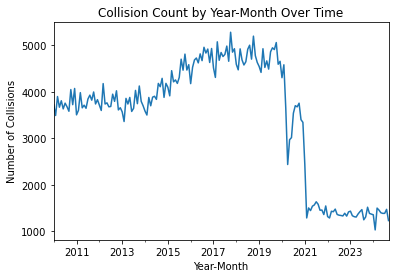

In [17]:
# Extract year and month from 'Date Occurred' column
df['YearMonth'] = df['Date Occurred'].dt.to_period('M')

# Get collision count by year-month
collision_count_by_year_month = df['YearMonth'].value_counts().sort_index()

# Plot the collision count over time
collision_count_by_year_month.plot(kind='line', title='Collision Count by Year-Month Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Number of Collisions')
plt.show()

In [18]:
collision_count_by_year_month

2010-01    3723
2010-02    3492
2010-03    3900
2010-04    3670
2010-05    3809
           ... 
2024-05    1396
2024-06    1383
2024-07    1384
2024-08    1470
2024-09    1228
Freq: M, Name: YearMonth, Length: 177, dtype: int64

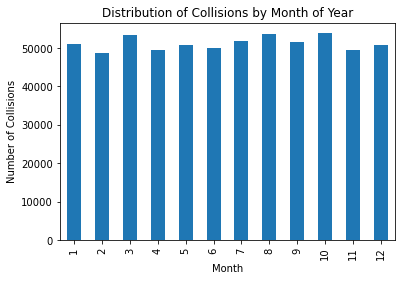

In [15]:
# Extract month from 'Date Occurred' column

df['Month'] = df['Date Occurred'].dt.month

# Get distribution of records by month
month_distribution = df['Month'].value_counts().sort_index()

# Plot the distribution
month_distribution.plot(kind='bar', title='Distribution of Collisions by Month of Year')
plt.xlabel('Month')
plt.ylabel('Number of Collisions')
plt.show()

In [16]:
month_distribution

1     50893
2     48722
3     53269
4     49406
5     50784
6     50093
7     51719
8     53721
9     51634
10    53891
11    49558
12    50866
Name: Month, dtype: int64

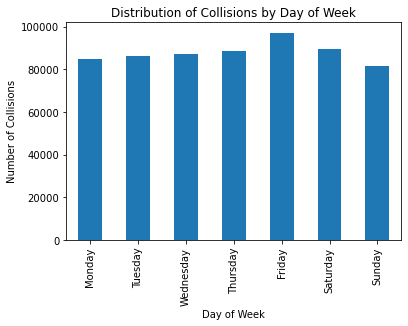

In [21]:
# Extract day of week from 'Date Occurred' column
df['DayOfWeek'] = df['Date Occurred'].dt.day_name()

# Get distribution of collisions by day of week
day_of_week_distribution = df['DayOfWeek'].value_counts().reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Plot the distribution
day_of_week_distribution.plot(kind='bar', title='Distribution of Collisions by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Collisions')
plt.show()

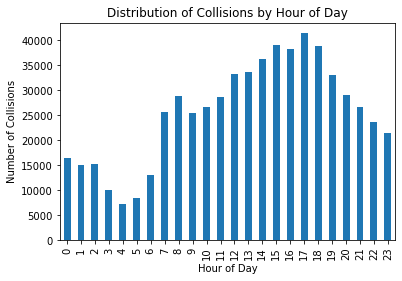

In [22]:
# Extract hour from 'Time Occurred Transformed' column
df['Hour'] = df['Time Occurred Transformed'].apply(lambda x: x.hour)

# Get distribution of collisions by hour of day
hour_distribution = df['Hour'].value_counts().sort_index()

# Plot the distribution
hour_distribution.plot(kind='bar', title='Distribution of Collisions by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Collisions')
plt.show()

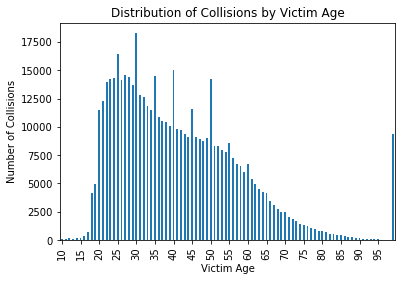

In [27]:
# Get distribution of collisions by victim age
age_distribution = df['Victim Age'].dropna().astype(int).value_counts().sort_index()

# Plot the distribution
age_distribution.plot(kind='bar', title='Distribution of Collisions by Victim Age')
plt.xlabel('Victim Age')
plt.xticks(ticks=range(0, len(age_distribution), 5))
plt.ylabel('Number of Collisions')
plt.show()

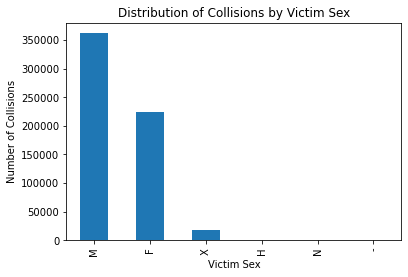

In [28]:
# Get distribution of collisions by victim sex
sex_distribution = df['Victim Sex'].value_counts()

# Plot the distribution
sex_distribution.plot(kind='bar', title='Distribution of Collisions by Victim Sex')
plt.xlabel('Victim Sex')
plt.ylabel('Number of Collisions')
plt.show()

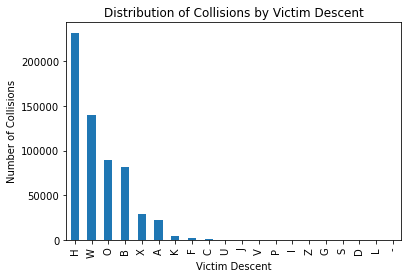

In [29]:
# Get distribution of collisions by victim descent
descent_distribution = df['Victim Descent'].value_counts()

# Plot the distribution
descent_distribution.plot(kind='bar', title='Distribution of Collisions by Victim Descent')
plt.xlabel('Victim Descent')
plt.ylabel('Number of Collisions')
plt.show()

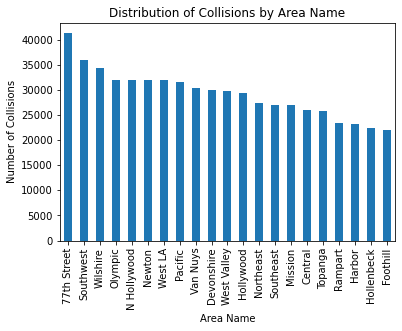

In [30]:
# Get distribution of collisions by area name
area_distribution = df['Area Name'].value_counts()

# Plot the distribution
area_distribution.plot(kind='bar', title='Distribution of Collisions by Area Name')
plt.xlabel('Area Name')
plt.ylabel('Number of Collisions')
plt.show()

In [32]:
import folium
from folium.plugins import HeatMap

In [41]:
# Create a map centered at the average latitude and longitude of your dataset
collision_map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=11)

# Prepare the data for the heatmap
# Convert it to a list of lists containing latitude and longitude
heat_data = [[row['Latitude'], row['Longitude']] for index, row in df.iterrows()]

# Add HeatMap to the map with a custom gradient
HeatMap(heat_data, 
        min_opacity=0.2,  # Adjust transparency
        max_zoom=18,      # Adjust zoom level
        radius=15,        # Radius of each point in the heatmap
        blur=15,          # Blurring of each point in the heatmap
        gradient={0.2: 'blue', 0.5: 'lime', 0.8: 'red'}  # Define your color gradient
       ).add_to(collision_map)

# Save the map to an HTML file
collision_map.save('collision_heatmap.html')

In [42]:
# Display the map inline
from IPython.display import display
display(collision_map)